In [303]:
import airportsdata
import numpy as np
import networkx as nx
import pandas as pd
import itertools
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import math
import sys, time
import random

airports = airportsdata.load()

In [90]:
import airportsdata
import numpy as np
import networkx as nx
import pandas as pd
import itertools
# from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import math
import sys, time
import random

airports = airportsdata.load()

In [101]:
def draw_flights_on_map(airline_network, axis,node_size,node_color='red', draw_node=True, draw_edge=True):
    m = Basemap()
    pos = {}
    for i in airline_network:
        longtitude = airports[i]['lon']
        latitude = airports[i]['lat']
        map_long, map_lat = m(longtitude,latitude)
        pos[i] = (longtitude, latitude)
    n_flights = np.fromiter(nx.get_edge_attributes(airline_network, 'value').values(),dtype=int)
    rgba_colors = list(n_flights/np.max(n_flights))
    # edges,n_flights = zip(*nx.get_edge_attributes(g,'value').items())
    if draw_node:
        nx.draw_networkx_nodes(airline_network,pos,
                               nodelist=airline_network.nodes(),
                               node_size=node_size,
                               node_color=node_color,
                               alpha=0.3,
                              ax=axis)
    if draw_edge:
        nx.draw_networkx_edges(airline_network,pos,
                               edgelist = airline_network.edges(),
                               edge_color=rgba_colors,
                               alpha=0.1,
                              ax=axis)
    m.drawcoastlines(ax=axis)

    m.drawcountries(ax=axis)


In [92]:
g_2019 = nx.read_gml("flightlist_20191201_20191231.gml", label="label")
g_2020_apr = nx.read_gml("flightlist_20200401_20200430.gml", label="label")
g_2020_apr.remove_edges_from(nx.selfloop_edges(g_2020_apr))
g_2019.remove_edges_from(nx.selfloop_edges(g_2019))

# The WAN data reveals a scale-free behavior with an exponential cutoff the exponential distribution with mean value equal to ⟨𝑘⟩. 

Dataset: Flight dataset Dec.2019
The average degree is: 31.850314465408804


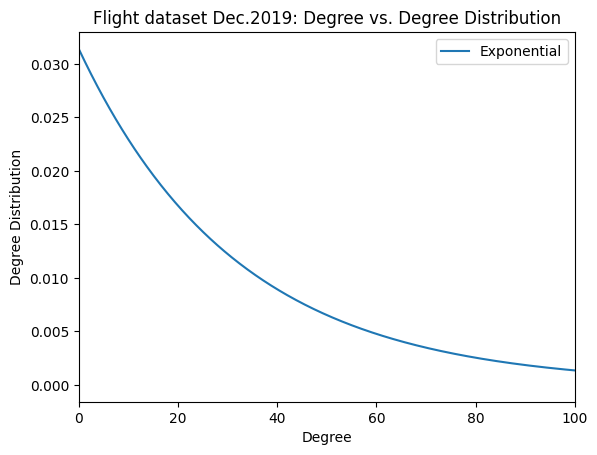

--------------------------------------------------------------------
Dataset: Flight dataset Apr.2020
The average degree is: 18.388059701492537


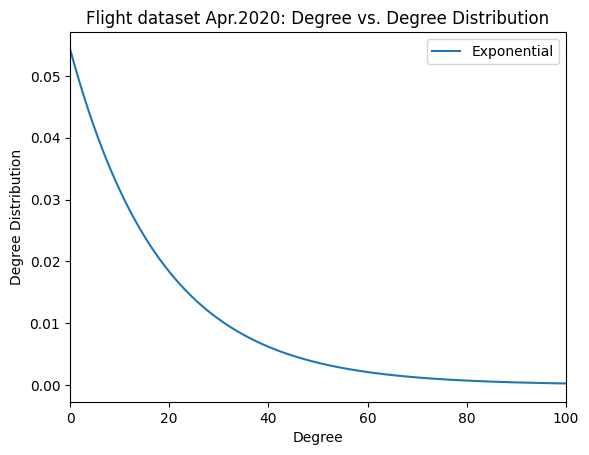

--------------------------------------------------------------------


In [5]:
# The WAN data reveals a scale-free behavior with an exponential cutoff
# the exponential distribution with mean value equal to ⟨𝑘⟩. 

def expo(k, lamda):
    return lamda**(-1) * np.exp(-k/lamda)

def myfunc(x,alpha):
    return x**(-alpha)

# Super mighty function ......
def dist_ave_pow(name, graph):
    print("Dataset: " + name)
    #Load degrees
    g_degrees = graph.degree()
    degrees = [ g_degrees[i] for i in graph.nodes() ]

    #Compute ave. degres
    sum_deg = []
    for i in degrees:
        sum_deg.append(i)
    ave_degree = sum(sum_deg) / len(sum_deg)
    print("The average degree is: " + str(ave_degree))

    # for expo
    k = np.sort(np.asarray([d for d in dict(graph.degree()).values()]), )
    spacing = np.linspace(min(k),max(k),len(k))

    #Create the plot
    # my_bins = np.logspace(np.log10(min(degrees)),np.log10(max(degrees) +1), 15 )
    # _ = plt.hist(degrees, bins = my_bins, density = True, label="Degree Dist.") 
    plt.plot(spacing,expo(spacing,ave_degree), label="Exponential")
    plt.title(name + ": Degree vs. Degree Distribution")
    plt.xlabel("Degree")
    plt.ylabel("Degree Distribution")
    
    plt.xlim([0, 100])
    plt.legend()
    plt.show()

    #Division between different datasets
    print("--------------------------------------------------------------------")


dist_ave_pow("Flight dataset Dec.2019", g_2019)
#dist_ave_pow("Flight dataset Feb.2020", flight_feb_20)
dist_ave_pow("Flight dataset Apr.2020", g_2020_apr)

# Plot of overall flights on Dec 2019 and Apr 2020

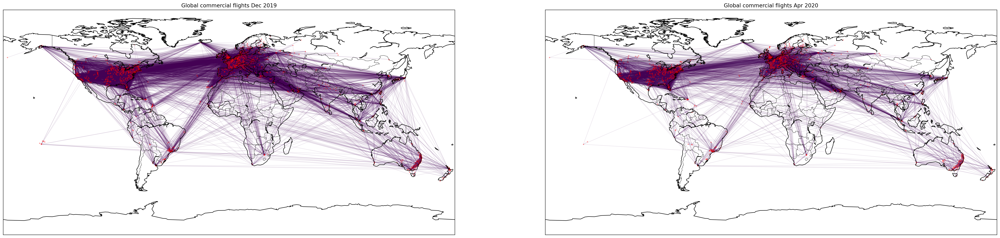

In [333]:
fig, axs = plt.subplots(1,2, figsize=(40,20), dpi=200)

draw_flights_on_map(g_2019,axs[0],3)
axs[0].set_title("Global commercial flights Dec 2019")

axs[1].set_title("Global commercial flights Apr 2020")
draw_flights_on_map(g_2020_apr,axs[1],3)


In [91]:
# Get euclidean distance between two airports
def get_distance_km(a_i, a_j, mode):
    if mode == 'weighted':
        long_1 = airports[a_i]['lon']
        long_2 = airports[a_j]['lon']
        lat_1 = airports[a_i]['lat']
        lat_2 = airports[a_j]['lat']
        return math.sqrt(((long_2 - long_1)**2) + ((lat_2 - lat_1)**2))
    elif mode == 'topology':
        return 1
    else:
        raise Exception('Unknown calculation mode')
get_distance_km('LIMC','LSZH','topology') 

1

In [93]:
# Calculate s_i
def s_i(g, node_name, mode):
    result = []
    for n in g[node_name]:
        result.append(1.0/get_distance_km(node_name, n, mode))
    if np.array(result).sum() == 0:
        return 1
    else:
        return np.array(result).sum()
s_i(g_2019,'LSZH','weighted')

43.473867900755685

0

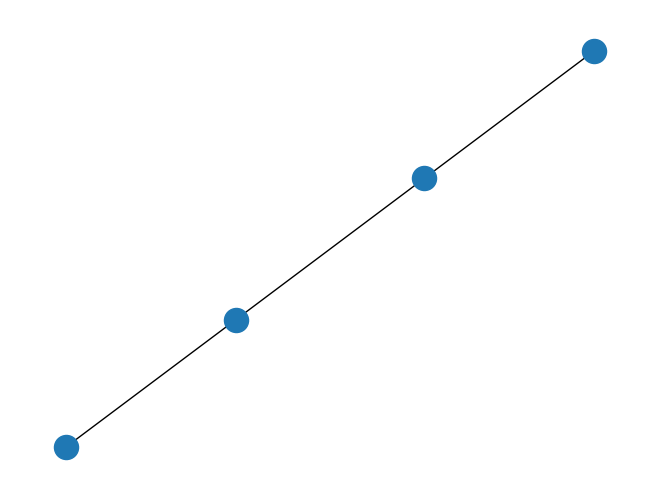

In [94]:
# Helper function determining if three nodes forms a triangle
def is_triangle(g, n_i, n_j, n_h):
    return 1 if n_i in g[n_j] and n_j in g[n_h] and n_h in g[n_i] else 0
G=nx.Graph()
G.add_edge('a','b',weight=1)
G.add_edge('a','c',weight=1)
G.add_edge('c','d',weight=1)
nx.draw(G)
is_triangle(G,'a','b','c')

In [95]:
def get_clustering_coefficient(g, mode='weighted'):
    result = {}
    for n_i in g:
        sum_of_neigh = 0
        neighbor_combs = [x for x in itertools.combinations(g[n_i], r=2)]
        for (n_j, n_h) in neighbor_combs:
            sum_of_neigh += (1.0/get_distance_km(n_i, n_j, mode) + 1.0/get_distance_km(n_i, n_h, mode)) / 2 * is_triangle(g, n_i, n_j, n_h)
        if s_i(g, n_i, mode) == 0:
            print("s_i is zero")
        i_degree_minus_1 = 1 if g.degree(n_i) - 1 == 0 else g.degree(n_i) - 1
        sum_of_neigh *= 1/(s_i(g, n_i, mode) * i_degree_minus_1)
        result[n_i] = sum_of_neigh
    return result

In [96]:
def draw_cluster_and_get_nodes_list(g, name):
    C_w = get_clustering_coefficient(g)
    C_c = get_clustering_coefficient(g, mode='topology')
    C_w_arr = pd.Series(C_w)
    C_c_arr = pd.Series(C_c)
    nodes_peri = C_w_arr.index[(C_w_arr == 0) & (C_w_arr == C_c_arr)].to_list()
    nodes_local = C_w_arr.index[C_w_arr > C_c_arr].to_list()
    nodes_global = C_w_arr.index[C_w_arr <= C_c_arr].to_list()
    fig, axs = plt.subplots(3, figsize=(30,40), dpi=200)
    fig.suptitle(f"Clusters of Airports {name}")
    axs[0].set_title("Global")
    draw_flights_on_map(g.subgraph(nodes_global), axs[0], 70,draw_edge=False, node_color='red')
    axs[1].set_title("Local")
    draw_flights_on_map(g.subgraph(nodes_local), axs[1], 70,draw_edge=False, node_color='green')
    axs[2].set_title("Peripheral")
    draw_flights_on_map(g.subgraph(nodes_peri), axs[2], 200,draw_edge=False, node_color='orange')
    plt.show()
    return nodes_peri, nodes_local, nodes_global

# Plot of peripheral, local, global clusters Dec 2019

NameError: name 'Basemap' is not defined

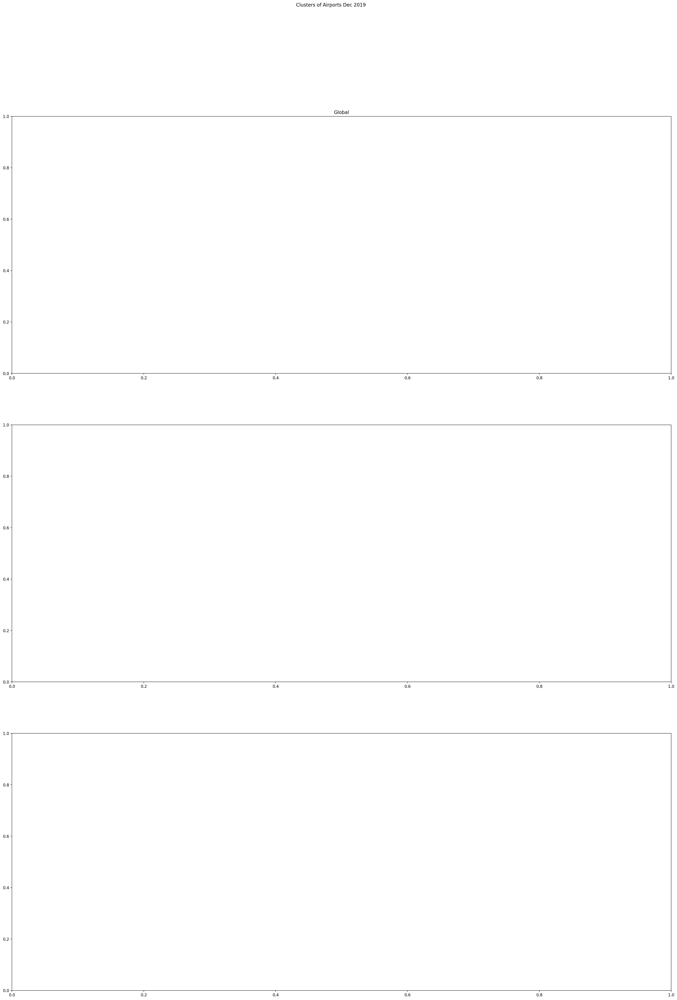

In [102]:
nodes_peri_2019, nodes_local_2019, nodes_global_2019 = draw_cluster_and_get_nodes_list(g_2019,'Dec 2019')

# $C_w$ 2019

In [481]:
get_clustering_coefficient(g_2019)

{'PAMR': 0.32204565683170194,
 'KDVT': 0.24549874154000584,
 'KPHX': 0.17760167640342983,
 'KSAC': 0.3098215325400189,
 'KSMF': 0.22830003804914278,
 'KPIE': 0.21685980024940446,
 'KATL': 0.13371549279846318,
 'KPDK': 0.19490782051499955,
 'KMKC': 0.21572906578031745,
 'KVCT': 0.5,
 'KABQ': 0.292243242072884,
 'KDAL': 0.2339521800572784,
 'KHOU': 0.21617802907918557,
 'KIND': 0.1594293076123697,
 'KMCI': 0.294902797092897,
 'KORL': 0.26237176965708764,
 'KHSV': 0.21701219470580332,
 'KRDU': 0.17128800060435376,
 'KTYR': 0.35399553388066524,
 'PAED': 0.170496023260641,
 'KMDW': 0.17962165797060758,
 'KMSN': 0.22778450175559373,
 'BIKF': 0.14583271823752877,
 'CYYC': 0.1929237956994045,
 'CYYZ': 0.10213729759165643,
 'EDDF': 0.11854047400507248,
 'EGCC': 0.1652175618133194,
 'EGKK': 0.21329029232110017,
 'KACK': 0.3080110155635054,
 'KADS': 0.28963435079314603,
 'KBED': 0.1411571786570482,
 'KBKL': 0.23326689481204285,
 'KBOS': 0.13271939401518726,
 'KBUF': 0.1534111537839712,
 'KBWI': 0

# $C_c$ 2019

In [482]:
get_clustering_coefficient(g_2019, 'topology')

{'PAMR': 0.2222222222222222,
 'KDVT': 0.23886328725038403,
 'KPHX': 0.2178030303030303,
 'KSAC': 0.3129445234708393,
 'KSMF': 0.3030694205393,
 'KPIE': 0.18359208090015666,
 'KATL': 0.13265125343254494,
 'KPDK': 0.18554671135316297,
 'KMKC': 0.21885714285714286,
 'KVCT': 0.5,
 'KABQ': 0.31110154905335624,
 'KDAL': 0.18982127433393128,
 'KHOU': 0.19128436668547932,
 'KIND': 0.18666898712147578,
 'KMCI': 0.29508480443059887,
 'KORL': 0.20147832396154544,
 'KHSV': 0.290391156462585,
 'KRDU': 0.20351737186102511,
 'KTYR': 0.3470588235294118,
 'PAED': 0.08888888888888889,
 'KMDW': 0.1630493098570941,
 'KMSN': 0.26092020966802565,
 'BIKF': 0.17765440666204024,
 'CYYC': 0.2117821782178218,
 'CYYZ': 0.12812299807815503,
 'EDDF': 0.11987345078803006,
 'EGCC': 0.1511496113989637,
 'EGKK': 0.14988290398126464,
 'KACK': 0.31858974358974357,
 'KADS': 0.23066514741489816,
 'KBED': 0.15238180090282727,
 'KBKL': 0.25874004845967463,
 'KBOS': 0.14544162917357328,
 'KBUF': 0.21446776611694152,
 'KBWI': 

# $C_w$ 2020

In [483]:
get_clustering_coefficient(g_2020_apr)

{'KDCU': 0.22145523346523358,
 'KHSV': 0.1880915340273619,
 'KDVT': 0.204473151490091,
 'KPHX': 0.15117385876269734,
 'KSAC': 0.28893954609438355,
 'KZPH': 0.259677560397235,
 'KPDK': 0.17429404865973716,
 'KHOU': 0.18334187966137172,
 'KRDU': 0.14751128979917022,
 'KSDF': 0.17634997346804568,
 'KBUF': 0.18321084644149147,
 'KFWA': 0.1811743450515248,
 'KPTK': 0.13848841985474908,
 'KADS': 0.23495318109478713,
 'KIAH': 0.1502613627040903,
 'KBFI': 0.2006469100209851,
 'KBLI': 0.17442276705596627,
 'KBOI': 0.17427001000136902,
 'KHIO': 0.22637425505217726,
 'KPAE': 0.20197365332611078,
 'KPDX': 0.1743259294273269,
 'KATW': 0.14893300390171807,
 'KFAT': 0.20810184471743692,
 'KBWI': 0.17578036852123627,
 'KFLL': 0.18481168751803478,
 'KMDW': 0.19801811607746722,
 'KMIA': 0.16059549758932815,
 'TJIG': 0.116577317292939,
 'KOSH': 0.31017184838771006,
 'KDVN': 0.3200603931169885,
 'KMLI': 0.15827355062288476,
 'KSTL': 0.18901283455365012,
 'KLEB': 0.24182208304920597,
 'KMHT': 0.31000404988

# $C_c$ 2020

In [ ]:
get_clustering_coefficient(g_2020, 'topology')

# Plot of peripheral, local, global clusters Apr 2020

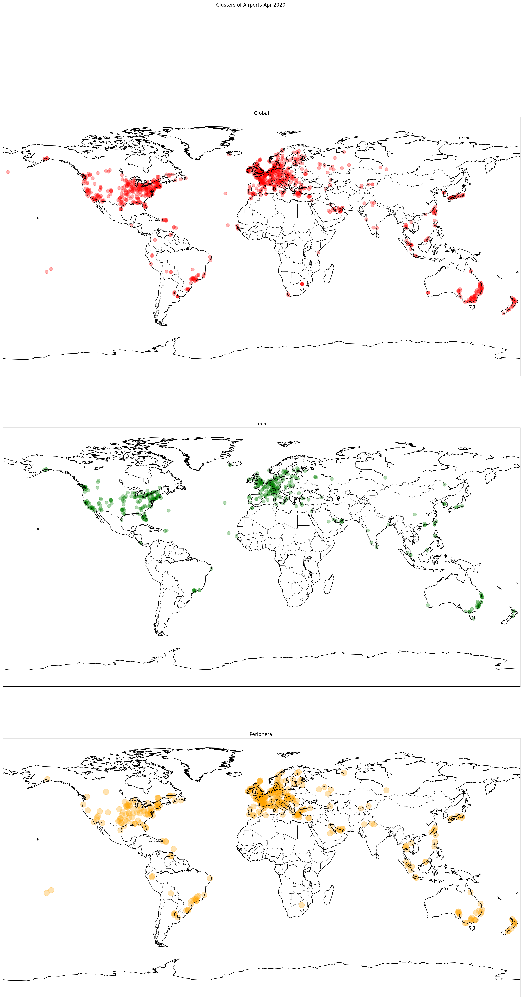

In [ ]:
nodes_peri_2020, nodes_local_2020, nodes_global_2020 = draw_cluster_and_get_nodes_list(g_2020_apr,'Apr 2020')

# Perform a t-core decomposition to the graph 

In [6]:
# Instead of removing the node from graph, we add an attribute to it called t_layer, then everytime we examine the nodes that
# are not assigned a layer yet
def remove_t_layer_node(g, t):
    t_layer_nodes = []
    for n_i in g:
        # Find out nodes that are still not assigned a layer
        t_layer_attri = nx.get_node_attributes(g, 't_layer')
        unassigned_nodes = [x for x,_ in g.nodes(data=True) if x not in t_layer_attri]
        # We don't have to deal with n_i if it is already assigned a layer
        if n_i in unassigned_nodes:
            # Get number of triangles that current node is involved
            n_triangles = nx.triangles(g.subgraph(unassigned_nodes), n_i)

            # If current node is t_layer node, we add it to result and examine further if after removal there are more t_layer nodes exposed
            if n_triangles <= t:
                sys.stdout.flush()
                sys.stdout.write('\r')
                sys.stdout.flush()
                sys.stdout.write(f"Removing: {n_i}")
                t_layer_nodes.append(n_i)
                nx.set_node_attributes(g, {n_i: t}, "t_layer")
                recur_t_layer_nodes, g = remove_t_layer_node(g, t)
                t_layer_nodes += recur_t_layer_nodes       
    return t_layer_nodes, g

In [7]:
def t_core_decomposition(g):
    result = {}
    # t_index is the current t_layer to be assigned
    t_index = 0
    while len(nx.get_node_attributes(g, 't_layer')) < g.number_of_nodes() != 0:                    
        print(f"\nCurrent layer {t_index}, {len(nx.get_node_attributes(g, 't_layer'))} of {g.number_of_nodes()} nodes assigned")
        t_layer_nodes, g = remove_t_layer_node(g, t_index)
        result[t_index] = t_layer_nodes
        t_index += 1 
    return result
g_2019 = nx.read_gml("flightlist_20191201_20191231.gml", label="label")
layer_nodes = t_core_decomposition(g_2019)


Current layer 0, 0 of 1590 nodes assigned
Removing: ZYHE
Current layer 1, 308 of 1590 nodes assigned
Removing: YTGA
Current layer 2, 424 of 1590 nodes assigned
Removing: SBVG
Current layer 3, 460 of 1590 nodes assigned
Removing: RCYU

KeyboardInterrupt: 

In [ ]:
# Helper function which combines all nodes within t_min and t_max
def get_node_list_by_t_value(nodes_dict, t_min, t_max):
    result = []
    for k, v in nodes_dict.items():
        if k >= t_min and k <= t_max:
            result += v
    return result

# Dec 2019 core, bridge, peripheral by t-core

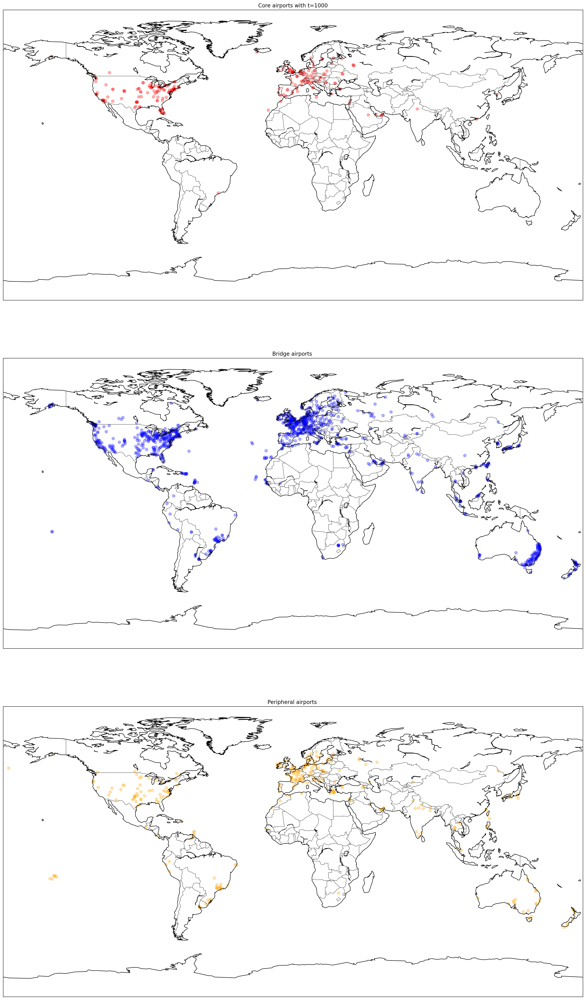

In [452]:
fig, axs = plt.subplots(3,figsize = (30,40), dpi=200)
axs[0].set_title("Core airports with t=1000")
axs[1].set_title("Bridge airports ")
axs[2].set_title("Peripheral airports ")
draw_flights_on_map(g_2019.subgraph(get_node_list_by_t_value(layer_nodes, 1000, max(layer_nodes.keys()))),axs[0], draw_edge=False, node_size=40)
draw_flights_on_map(g_2019.subgraph(layer_nodes[0]),axs[2], node_size=40,node_color='orange')
draw_flights_on_map(g_2019.subgraph(get_node_list_by_t_value(layer_nodes, 1, 999)),axs[1], draw_edge=False, node_size=40, node_color='blue')

In [ ]:
layer_nodes_2020 = t_core_decomposition(g_2020_apr)


Current layer 0, 0 of 1327 nodes assigned
Removing: ZSAM
Current layer 1, 360 of 1327 nodes assigned
Removing: YWGT
Current layer 2, 498 of 1327 nodes assigned
Removing: YQDI
Current layer 3, 556 of 1327 nodes assigned
Removing: YFST
Current layer 4, 611 of 1327 nodes assigned
Removing: WSAT
Current layer 5, 638 of 1327 nodes assigned
Removing: WBKL
Current layer 6, 666 of 1327 nodes assigned
Removing: YTMU
Current layer 7, 710 of 1327 nodes assigned
Removing: YMES
Current layer 8, 731 of 1327 nodes assigned
Removing: YBNA
Current layer 9, 739 of 1327 nodes assigned
Removing: YBNS
Current layer 10, 756 of 1327 nodes assigned
Removing: YGFN
Current layer 11, 769 of 1327 nodes assigned
Removing: LOWK
Current layer 12, 783 of 1327 nodes assigned
Removing: SDAM
Current layer 13, 794 of 1327 nodes assigned
Removing: YNBR
Current layer 14, 806 of 1327 nodes assigned
Removing: YSNW
Current layer 15, 819 of 1327 nodes assigned
Removing: YNSH
Current layer 16, 830 of 1327 nodes assigned
Removi

# Apr 2020 core, bridge, peripheral by t-core

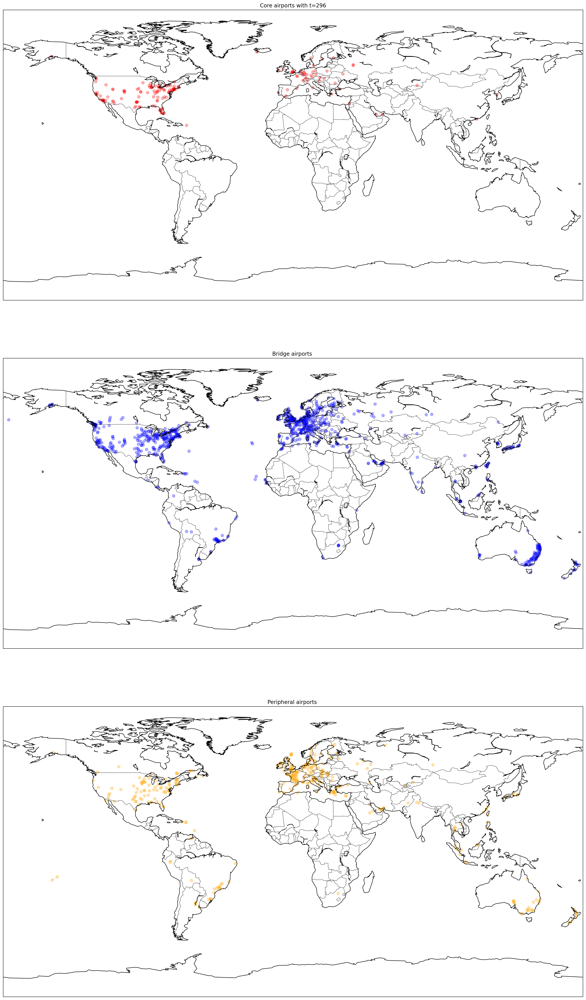

In [460]:
fig, axs = plt.subplots(3,figsize = (30,40), dpi=200)
axs[0].set_title("Core airports with t=296")
axs[1].set_title("Bridge airports ")
axs[2].set_title("Peripheral airports ")
draw_flights_on_map(g_2020_apr.subgraph(get_node_list_by_t_value(layer_nodes_2020, 296, max(layer_nodes_2020.keys()))),axs[0], draw_edge=False, node_size=40)
draw_flights_on_map(g_2020_apr.subgraph(layer_nodes_2020[0]),axs[2], node_size=40,node_color='orange')
draw_flights_on_map(g_2020_apr.subgraph(get_node_list_by_t_value(layer_nodes_2020, 1, 295)),axs[1], draw_edge=False, node_size=40, node_color='blue')

In [463]:
29*15*4

1740

# Connectivity

In [101]:
def delete_random_elems(input_list, n):
    to_delete = set(random.sample(range(len(input_list)), n))
    return [x for i,x in enumerate(input_list) if i in to_delete]

def high_deg(graph):
    l_high = []
    nodes_list = sorted(graph.degree(), key=lambda x: x[1], reverse=True)
    for node in nodes_list:
        l_high.append(node[0])
    return l_high

def low_deg(graph):
    l_low = []
    nodes_list = sorted(graph.degree(), key=lambda x: x[1])
    for node in nodes_list:
        l_low.append(node[0])
    return l_low

def LCC_vs_removal_nodes(removed_fraction, file_name, typ):
    # Average fraction of nodes as a function of removed nodes
    g = nx.read_gml(file_name)
    
    nodes_count = nx.number_of_nodes(g)
    nodes_list = list(g.nodes())
    random.shuffle(nodes_list)

    high_19_dec = high_deg(g)
    high_20_apr = high_deg(g)
    low_19_dec = low_deg(g)
    low_20_apr = low_deg(g)
    # high_19_dec = get_node_list_by_t_value(layer_nodes, 1000, max(layer_nodes.keys())).copy()
    # high_20_apr = get_node_list_by_t_value(layer_nodes_2020, 296, max(layer_nodes_2020.keys())).copy()
    # peri_19_dec = get_node_list_by_t_value(layer_nodes, 1, 999).copy()
    # peri_20_apr = get_node_list_by_t_value(layer_nodes_2020, 1, 295).copy()
    NG = []
    #C = []

    for i in removed_fraction:

        if typ == "random":
            # Random remove
            
            g.remove_nodes_from(nodes_list[:int(i * nodes_count)])
            #print(len(delete_random_elems(nodes_dec_19, int(i * len(nodes_dec_19)))))
        elif typ == "high":
            # remove important (high degree) nodes
            if file_name == "flightlist_20191201_20191231.gml":
                g.remove_nodes_from(high_19_dec[:int(i * nodes_count)])
            else:
                g.remove_nodes_from(high_20_apr[:int(i * nodes_count)])
        else:
            if file_name == "flightlist_20191201_20191231.gml":
                g.remove_nodes_from(low_19_dec[:int(i * nodes_count)])
            else:
                g.remove_nodes_from(low_20_apr[:int(i * nodes_count)])          

        tmp_NG = []
        print("Remaining nodes: " + str(nx.number_of_nodes(g)))

        for j in range(501):
            # Largest Connected Component
            tmp_NG.append(len(max([c for c in nx.connected_components(g)],key=len))/nodes_count)
            #tmp_C.append(nx.average_clustering(g_2019))

        NG.append(sum(tmp_NG)/len(tmp_NG))
        #C.append(sum(tmp_C)/len(tmp_C))
    print("-------------------------")
    return NG

In [102]:
removed_fraction_nodes = []
frac = 0

while frac <= 1:
    removed_fraction_nodes.append(frac)
    frac = frac + 0.02

random_NG_2019_dec = []
random_NG_2020_apr = []

high_NG_2019_dec = []
high_NG_2020_apr = []

low_NG_2019_dec = []
low_NG_2020_apr = []

random_NG_2019_dec = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20191201_20191231.gml", "random")
random_NG_2020_apr = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20200401_20200430.gml", "random")
high_NG_2019_dec = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20191201_20191231.gml", "high")
high_NG_2020_apr = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20200401_20200430.gml", "high")
low_NG_2019_dec = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20191201_20191231.gml", "low")
low_NG_2020_apr = LCC_vs_removal_nodes(removed_fraction_nodes, "flightlist_20200401_20200430.gml", "low")

Remaining nodes: 1590
Remaining nodes: 1559
Remaining nodes: 1527
Remaining nodes: 1495
Remaining nodes: 1463
Remaining nodes: 1431
Remaining nodes: 1400
Remaining nodes: 1368
Remaining nodes: 1336
Remaining nodes: 1304
Remaining nodes: 1272
Remaining nodes: 1241
Remaining nodes: 1209
Remaining nodes: 1177
Remaining nodes: 1145
Remaining nodes: 1113
Remaining nodes: 1082
Remaining nodes: 1050
Remaining nodes: 1018
Remaining nodes: 986
Remaining nodes: 954
Remaining nodes: 923
Remaining nodes: 891
Remaining nodes: 859
Remaining nodes: 827
Remaining nodes: 795
Remaining nodes: 764
Remaining nodes: 732
Remaining nodes: 700
Remaining nodes: 668
Remaining nodes: 636
Remaining nodes: 605
Remaining nodes: 573
Remaining nodes: 541
Remaining nodes: 509
Remaining nodes: 477
Remaining nodes: 446
Remaining nodes: 414
Remaining nodes: 382
Remaining nodes: 350
Remaining nodes: 318
Remaining nodes: 287
Remaining nodes: 255
Remaining nodes: 223
Remaining nodes: 191
Remaining nodes: 159
Remaining nodes

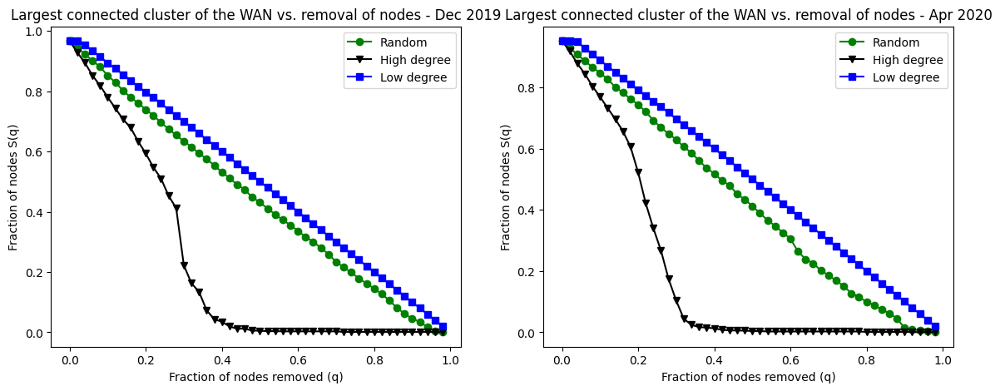

In [103]:
figure, axis = plt.subplots(1, 2, figsize=(14,5))

axis[0].plot(removed_fraction_nodes, random_NG_2019_dec, marker='o', label="Random",color = 'g')
axis[0].plot(removed_fraction_nodes, high_NG_2019_dec, marker='v', label="High degree",color = 'k')
axis[0].plot(removed_fraction_nodes, low_NG_2019_dec, marker='s', label="Low degree",color = 'b')
axis[0].set_title("Largest connected cluster of the WAN vs. removal of nodes - Dec 2019")
axis[0].set_xlabel("Fraction of nodes removed (q)")
axis[0].set_ylabel("Fraction of nodes S(q)")
axis[0].legend()
#axis[0].set_xscale("log")
#axis[0].set_yscale("log")

axis[1].plot(removed_fraction_nodes, random_NG_2020_apr, marker='o', label="Random", color = 'g')
axis[1].plot(removed_fraction_nodes, high_NG_2020_apr, marker='v', label="High degree", color = 'k')
axis[1].plot(removed_fraction_nodes, low_NG_2020_apr, marker='s', label="Low degree", color = 'b')
axis[1].set_title("Largest connected cluster of the WAN vs. removal of nodes - Apr 2020")
axis[1].set_xlabel("Fraction of nodes removed (q)")
axis[1].set_ylabel("Fraction of nodes S(q)")
# axis[1].set_xscale("log")
# axis[1].set_yscale("log")
axis[1].legend()

plt.show()

# Degree of connectivity

In [98]:
def delete_random_elems(input_list, n):
    to_delete = set(random.sample(range(len(input_list)), n))
    return [x for i,x in enumerate(input_list) if i in to_delete]

def high_traffic(graph):
    l_high = []
    edges_list = sorted(graph.edges(data=True), key=lambda t: t[2].get('value', 1), reverse=True)
    for edge in edges_list:
        l_high.append((edge[0], edge[1]))
    return l_high

def low_traffic(graph):
    l_low = []
    edges_list = sorted(graph.edges(data=True), key=lambda t: t[2].get('value', 1))
    for edge in edges_list:
        l_low.append((edge[0], edge[1]))
    return l_low

def LCC_vs_removal_links(removed_fraction, file_name, typ):
    # Average fraction of nodes as a function of removed nodes
    g = nx.read_gml(file_name)
    
    edges_count = nx.number_of_edges(g)
    edges_list = list(g.edges())
    random.shuffle(edges_list)

    high_19_dec = high_traffic(g)
    high_20_apr = high_traffic(g)
    low_19_dec = low_traffic(g)
    low_20_apr = low_traffic(g)
 
    NG = []
    #C = []

    for i in removed_fraction:

        if typ == "random":
            # Random remove
            
            g.remove_edges_from(edges_list[:int(i * edges_count)])
            #print(len(delete_random_elems(nodes_dec_19, int(i * len(nodes_dec_19)))))
        elif typ == "high":
            # remove important (high degree) nodes
            if file_name == "flightlist_20191201_20191231.gml":
                g.remove_edges_from(high_19_dec[:int(i * edges_count)])
            else:
                g.remove_edges_from(high_20_apr[:int(i * edges_count)])
        else:
            if file_name == "flightlist_20191201_20191231.gml":
                g.remove_edges_from(low_19_dec[:int(i * edges_count)])
            else:
                g.remove_edges_from(low_20_apr[:int(i * edges_count)])          

        tmp_NG = []
        print("Remaining edges: " + str(nx.number_of_edges(g)))

        for j in range(501):
            # Largest Connected Component
            tmp_NG.append(len(max([c for c in nx.connected_components(g)],key=len))/nx.number_of_nodes(g))
            #tmp_C.append(nx.average_clustering(g_2019))

        NG.append(sum(tmp_NG)/len(tmp_NG))
        #C.append(sum(tmp_C)/len(tmp_C))
    print("-------------------------")
    return NG

In [132]:
removed_fraction_edges = []
frac = 0

while frac <= 1:
    removed_fraction_edges.append(frac)
    frac = frac + 0.02

random_NG_2019_dec = []
random_NG_2020_apr = []

high_NG_2019_dec = []
high_NG_2020_apr = []

low_NG_2019_dec = []
low_NG_2020_apr = []

random_NG_2019_dec = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "random")
random_NG_2020_apr = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "random")
high_NG_2019_dec = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "high")
high_NG_2020_apr = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "high")
low_NG_2019_dec = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "low")
low_NG_2020_apr = LCC_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "low")

Remaining edges: 26135
Remaining edges: 25613
Remaining edges: 25090
Remaining edges: 24567
Remaining edges: 24045
Remaining edges: 23522
Remaining edges: 22999
Remaining edges: 22477
Remaining edges: 21954
Remaining edges: 21431
Remaining edges: 20908
Remaining edges: 20386
Remaining edges: 19863
Remaining edges: 19340
Remaining edges: 18818
Remaining edges: 18295
Remaining edges: 17772
Remaining edges: 17250
Remaining edges: 16727
Remaining edges: 16204
Remaining edges: 15681
Remaining edges: 15159
Remaining edges: 14636
Remaining edges: 14113
Remaining edges: 13591
Remaining edges: 13068
Remaining edges: 12545
Remaining edges: 12023
Remaining edges: 11500
Remaining edges: 10977
Remaining edges: 10454
Remaining edges: 9932
Remaining edges: 9409
Remaining edges: 8886
Remaining edges: 8364
Remaining edges: 7841
Remaining edges: 7318
Remaining edges: 6796
Remaining edges: 6273
Remaining edges: 5750
Remaining edges: 5227
Remaining edges: 4705
Remaining edges: 4182
Remaining edges: 3659
R

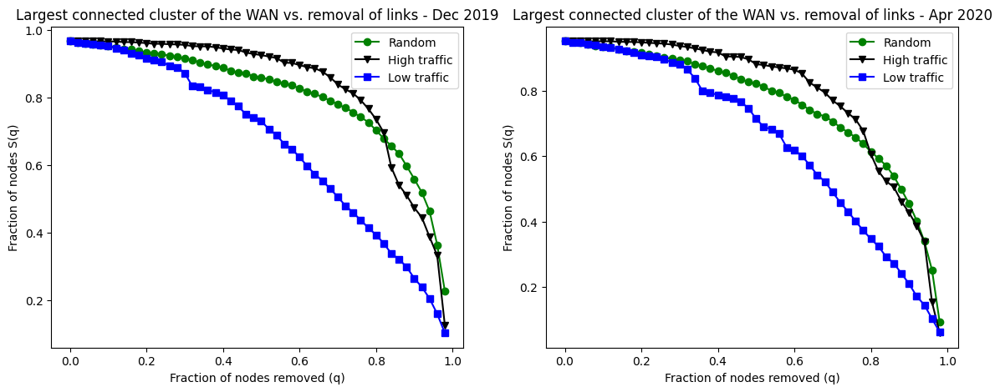

In [134]:
figure, axis = plt.subplots(1, 2, figsize=(14,5))

axis[0].plot(removed_fraction_edges, random_NG_2019_dec, marker='o', label="Random",color = 'g')
axis[0].plot(removed_fraction_edges, high_NG_2019_dec, marker='v', label="High traffic",color = 'k')
axis[0].plot(removed_fraction_edges, low_NG_2019_dec, marker='s', label="Low traffic",color = 'b')
axis[0].set_title("Largest connected cluster of the WAN vs. removal of links - Dec 2019")
axis[0].set_xlabel("Fraction of nodes removed (q)")
axis[0].set_ylabel("Fraction of nodes S(q)")
axis[0].legend()
#axis[0].set_xscale("log")
#axis[0].set_yscale("log")

axis[1].plot(removed_fraction_edges, random_NG_2020_apr, marker='o', label="Random", color = 'g')
axis[1].plot(removed_fraction_edges, high_NG_2020_apr, marker='v', label="High traffic", color = 'k')
axis[1].plot(removed_fraction_edges, low_NG_2020_apr, marker='s', label="Low traffic", color = 'b')
axis[1].set_title("Largest connected cluster of the WAN vs. removal of links - Apr 2020")
axis[1].set_xlabel("Fraction of nodes removed (q)")
axis[1].set_ylabel("Fraction of nodes S(q)")
# axis[1].set_xscale("log")
# axis[1].set_yscale("log")
axis[1].legend()

plt.show()

# Clustering

In [99]:
def drop_airport(largest_component, nodes_category):
    remained_airport = []

    for airport in nodes_category:
        if airport in largest_component:
            remained_airport.append(airport)

    return len(remained_airport)

def drop_air_vs_removal_links(removed_fraction, file_name, typ, nodes_peri, nodes_global, nodes_local):
    # Average fraction of nodes as a function of removed nodes
    g = nx.read_gml(file_name)
    
    edges_count = nx.number_of_edges(g)
    edges_list = list(g.edges())
    random.shuffle(edges_list)

    if typ == "high":
        links= high_traffic(g)
    elif typ == "low":
        links = low_traffic(g)

    drop_peri = []
    drop_global = []
    drop_local = []

    for i in removed_fraction:
        if typ == "random":
            # Random remove
            
            g.remove_edges_from(edges_list[:int(i * edges_count)])
            #print(len(delete_random_elems(nodes_dec_19, int(i * len(nodes_dec_19)))))
        else:
            g.remove_edges_from(links[:int(i * edges_count)])       

        tmp_drop_peri = []
        tmp_drop_global = []
        tmp_drop_local = []
        #print("Remaining edges: " + str(nx.number_of_edges(g)))

        for j in range(50):
            # Largest Connected Component
            largest_component = max([c for c in nx.connected_components(g)],key=len) 
            tmp_drop_peri.append(drop_airport(largest_component, nodes_peri))
            tmp_drop_global.append(drop_airport(largest_component, nodes_global))
            tmp_drop_local.append(drop_airport(largest_component, nodes_local))
               
        drop_peri.append((sum(tmp_drop_peri)/len(tmp_drop_peri))/len(nodes_peri))
        drop_global.append((sum(tmp_drop_global)/len(tmp_drop_global))/len(nodes_global))
        drop_local.append((sum(tmp_drop_local)/len(tmp_drop_local))/len(nodes_local))

    print("Finished 1 dataset")
    return drop_peri, drop_global, drop_local 

In [100]:
removed_fraction_edges = []
frac = 0

while frac <= 1:
    removed_fraction_edges.append(frac)
    frac = frac + 0.02

random_NG_peri_2019 = []
random_NG_global_2019 = []
random_NG_local_2019 =[]

high_NG_peri_2019 = []
high_NG_global_2019 = []
high_NG_local_2019 = []

low_NG_peri_2019 = []
low_NG_global_2019 = []
low_NG_local_2019 = []

random_NG_peri_2019, random_NG_global_2019, random_NG_local_2019 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "random", nodes_peri_2019, nodes_global_2019, nodes_local_2019)
high_NG_peri_2019, high_NG_global_2019, high_NG_local_2019 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "high",nodes_peri_2019, nodes_global_2019, nodes_local_2019)
low_NG_peri_2019, low_NG_global_2019, low_NG_local_2019 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20191201_20191231.gml", "low",nodes_peri_2019, nodes_global_2019, nodes_local_2019)

NameError: name 'nodes_peri_2019' is not defined

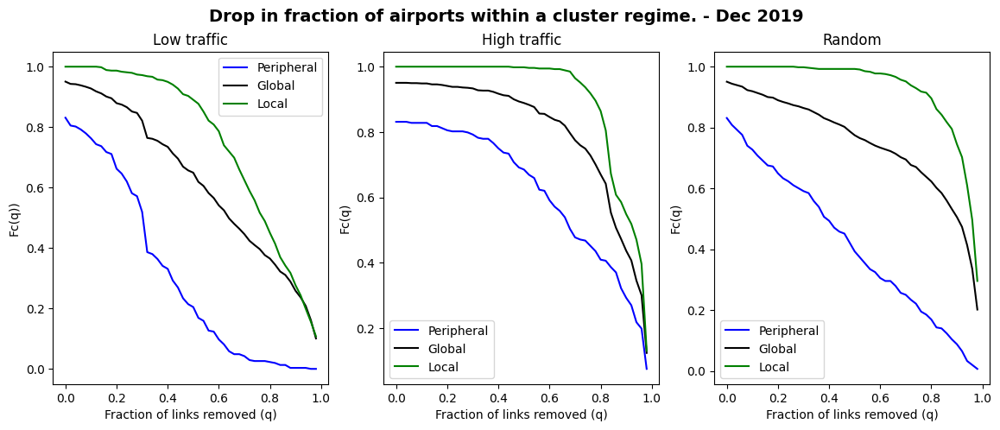

In [89]:
figure, axis = plt.subplots(1, 3, figsize=(14,5))

axis[2].plot(removed_fraction_edges, random_NG_peri_2019, label="Peripheral",color = 'b')
axis[2].plot(removed_fraction_edges, random_NG_global_2019, label="Global",color = 'k')
axis[2].plot(removed_fraction_edges, random_NG_local_2019, label="Local",color = 'g')
axis[2].set_title("Random")
axis[2].set_xlabel("Fraction of links removed (q)")
axis[2].set_ylabel("Fc(q)")
axis[2].legend()
#axis[0].set_xscale("log")
#axis[0].set_yscale("log")

axis[1].plot(removed_fraction_edges, high_NG_peri_2019,  label="Peripheral", color = 'b')
axis[1].plot(removed_fraction_edges, high_NG_global_2019, label="Global", color = 'k')
axis[1].plot(removed_fraction_edges, high_NG_local_2019, label="Local", color = 'g')
axis[1].set_title("High traffic")
axis[1].set_xlabel("Fraction of links removed (q)")
axis[1].set_ylabel("Fc(q)")
# # axis[1].set_xscale("log")
# # axis[1].set_yscale("log")
axis[1].legend()

axis[0].plot(removed_fraction_edges, low_NG_peri_2019, label="Peripheral", color = 'b')
axis[0].plot(removed_fraction_edges, low_NG_global_2019, label="Global", color = 'k')
axis[0].plot(removed_fraction_edges, low_NG_local_2019,  label="Local", color = 'g')
axis[0].set_title("Low traffic")
axis[0].set_xlabel("Fraction of links removed (q)")
axis[0].set_ylabel("Fc(q))")
axis[0].legend()

figure.suptitle('Drop in fraction of airports within a cluster regime. - Dec 2019', fontsize=14, fontweight='bold')
plt.show()

In [74]:
random_NG_peri_2020 = []
random_NG_global_2020 = []
random_NG_local_2020 =[]

high_NG_peri_2020 = []
high_NG_global_2020 = []
high_NG_local_2020 = []

low_NG_peri_2020 = []
low_NG_global_2020 = []
low_NG_local_2020 = []

random_NG_peri_2020, random_NG_global_2020, random_NG_local_2020 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "random",nodes_peri_2020, nodes_global_2020, nodes_local_2020)
high_NG_peri_2020, high_NG_global_2020, high_NG_local_2020 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "high",nodes_peri_2020, nodes_global_2020, nodes_local_2020)
low_NG_peri_2020, low_NG_global_2020, low_NG_local_2020 = drop_air_vs_removal_links(removed_fraction_edges, "flightlist_20200401_20200430.gml", "low",nodes_peri_2020, nodes_global_2020, nodes_local_2020)

Finished 1 dataset
Finished 1 dataset
Finished 1 dataset


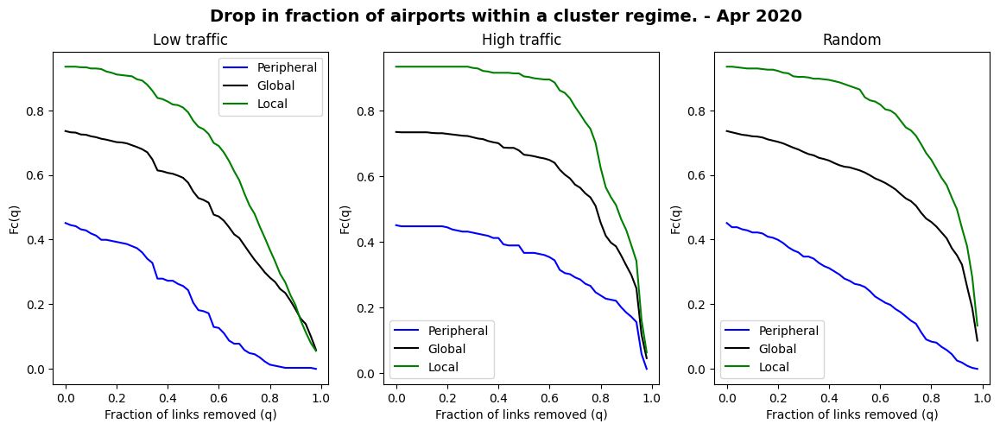

In [86]:
figure, axis = plt.subplots(1, 3, figsize=(14,5))

axis[2].plot(removed_fraction_edges, random_NG_peri_2020, label="Peripheral",color = 'b')
axis[2].plot(removed_fraction_edges, random_NG_global_2020, label="Global",color = 'k')
axis[2].plot(removed_fraction_edges, random_NG_local_2020, label="Local",color = 'g')
axis[2].set_title("Random")
axis[2].set_xlabel("Fraction of links removed (q)")
axis[2].set_ylabel("Fc(q)")
axis[2].legend()
#axis[0].set_xscale("log")
#axis[0].set_yscale("log")

axis[1].plot(removed_fraction_edges, high_NG_peri_2020,  label="Peripheral", color = 'b')
axis[1].plot(removed_fraction_edges, high_NG_global_2020, label="Global", color = 'k')
axis[1].plot(removed_fraction_edges, high_NG_local_2020, label="Local", color = 'g')
axis[1].set_title("High traffic")
axis[1].set_xlabel("Fraction of links removed (q)")
axis[1].set_ylabel("Fc(q)")
# # axis[1].set_xscale("log")
# # axis[1].set_yscale("log")
axis[1].legend()

axis[0].plot(removed_fraction_edges, low_NG_peri_2020, label="Peripheral", color = 'b')
axis[0].plot(removed_fraction_edges, low_NG_global_2020, label="Global", color = 'k')
axis[0].plot(removed_fraction_edges, low_NG_local_2020,  label="Local", color = 'g')
axis[0].set_title("Low traffic")
axis[0].set_xlabel("Fraction of links removed (q)")
axis[0].set_ylabel("Fc(q)")
axis[0].legend()

figure.suptitle('Drop in fraction of airports within a cluster regime. - Apr 2020', fontsize=14, fontweight='bold')
plt.show()